# Contexto câncer colo-retal e microbioma intestinal
O câncer colorretal é uma das neoplasias malignas mais comuns e fatais no mundo, afetando principalmente o cólon e o reto, e estando entre as principais causas de morbimortalidade, inclusive no Brasil. Fatores como dieta rica em carnes vermelhas e processadas, sedentarismo, predisposição genética e obesidade aumentam o risco para o desenvolvimento deste tipo de câncer.

Nas últimas décadas, a relação entre o microbioma intestinal e o câncer colorretal tornou-se um dos temas mais estudados na medicina de precisão. Pesquisas mostram que alterações na composição e diversidade da microbiota intestinal (condição conhecida como disbiose) contribuem para um ambiente intestinal propício ao desenvolvimento de tumores. Certas bactérias, como *Fusobacterium nucleatum*, podem promover inflamação crônica, produzir toxinas genotóxicas que danificam o DNA das células do intestino e favorecer o microambiente tumoral.

Além disso, a análise do microbioma tem potencial para auxiliar no diagnóstico precoce, prognóstico e personalização de estratégias terapêuticas em pacientes com câncer colorretal, uma vez que padrões específicos de microbiota vêm sendo descritos em portadores da doença, diferenciando-os de indivíduos saudáveis. O estudo das interações entre o microbioma, a inflamação local e os mecanismos imunológicos segue sendo fundamental para o avanço da medicina personalizada e o manejo mais eficaz do câncer colorretal.

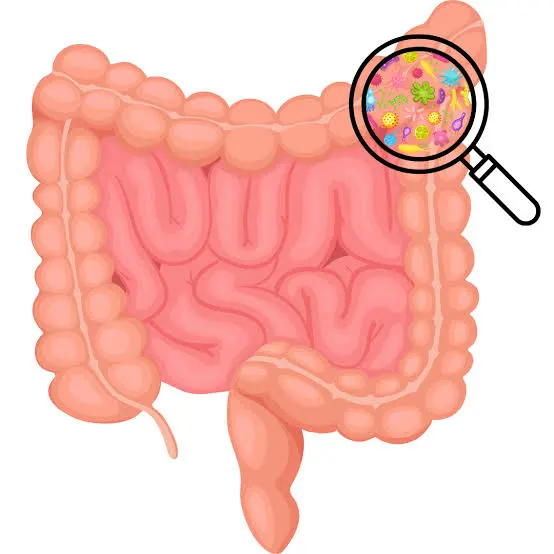

# 0. Configuração de Ambiente **padrão**

In [1]:
%%bash
cd ..
./activateEnv.sh

In [2]:
%%bash
# Instalar os software que vamos usar nesta prática
mamba install -c bioconda -c conda-forge fastqc bwa cutadapt samtools kraken2 krona spades -y


Pinned packages:

  - python=3.10



error    libmamba Could not create directory '/usr/pkgs': Permission denied



Transaction

  Prefix: /home/figa/Documents/Programming/VSCode/Metagenomics-Course/env

  Updating specs:

   - fastqc
   - bwa
   - cutadapt
   - samtools
   - kraken2
   - krona
   - spades


  Package             Version  Build             Channel           Size
─────────���────────────────────────────────��──────────────────────────────
  Install:
────────────────────────────────���────────────────────────────────��───────

  + blast              2.16.0  hc155240_3        bioconda         148MB
  + curl                8.8.0  he654da7_1        conda-forge      166kB
  + entrez-direct        22.4  he881be0_0        bioconda          15MB
  + kraken2             2.1.3  pl5321hdcf5f25_3  bioconda         263kB
  + krona               2.8.1  pl5321hdfd78af_1  bioconda        Cached
  + ncbi-vdb            3.2.1  h9948957_0        bioconda        Cached
  + perl-archive-tar     3.04  pl5321hdfd78af_0  bioconda        Cached
  + perl-io-zlib         1.15  pl5321hdfd78af_1  bioconda      

warning  libmamba [blast-2.16.0-hc155240_3] The following files were already present in the environment:
    - bin/rpsblast


Linking kraken2-2.1.3-pl5321hdcf5f25_3

Transaction finished



In [ ]:
%%bash
# Testa se um deles foi instalado corretamente (deve printar o manual de uso do programa)
kraken2 --help

Usage: kraken2 [options] <filename(s)>

Options:
  --db NAME               Name for Kraken 2 DB
                          (default: none)
  --threads NUM           Number of threads (default: 1)
  --quick                 Quick operation (use first hit or hits)
  --unclassified-out FILENAME
                          Print unclassified sequences to filename
  --classified-out FILENAME
                          Print classified sequences to filename
  --output FILENAME       Print output to filename (default: stdout); "-" will
                          suppress normal output
  --confidence FLOAT      Confidence score threshold (default: 0.0); must be
                          in [0, 1].
  --minimum-base-quality NUM
                          Minimum base quality used in classification (def: 0,
                          only effective with FASTQ input).
  --report FILENAME       Print a report with aggregrate counts/clade to file
  --use-mpa-style         With --report, format report output

In [3]:
%%bash
# Criar as pastas para organizar os arquivos que serão gerados
mkdir raw fastqc cutadapt bwa krakenDB kraken2 krona spades metadata

In [4]:
%%bash
# Mover arquivos para as suas respectivas pastas
unzip CLC.zip -d raw
rm CLC.zip
mv metadata.csv metadata/

Archive:  CLC.zip
  inflating: raw/SRR30861080_1.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861080_1.fastq.gz  
  inflating: raw/SRR30861080_2.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861080_2.fastq.gz  
  inflating: raw/SRR30861081_1.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861081_1.fastq.gz  
  inflating: raw/SRR30861081_2.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861081_2.fastq.gz  
  inflating: raw/SRR30861084_1.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861084_1.fastq.gz  
  inflating: raw/SRR30861084_2.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861084_2.fastq.gz  
  inflating: raw/SRR30861108_1.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861108_1.fastq.gz  
  inflating: raw/SRR30861108_2.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861108_2.fastq.gz  
  inflating: raw/SRR30861109_1.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861109_1.fastq.gz  
  inflating: raw/SRR30861109_2.fastq.gz  
  inflating: raw/__MACOSX/._SRR30861109_2.fastq.gz  
  inflating: raw/SRR30861111_1.f

mv: cannot stat 'metadata.csv': No such file or directory


CalledProcessError: Command 'b'# Mover arquivos para as suas respectivas pastas\nunzip CLC.zip -d raw\nrm CLC.zip\nmv metadata.csv metadata/\n'' returned non-zero exit status 1.

**Checkpoint 1:**  
Antes de seguir, verifique se as pastas foram criadas. Os arquivos fastqs dos pacientes deve estar dentro da pasta raw/ (20 arquivos), e o arquivo de metadados da nossa cohorte deve estar em metadata/

# 1. Controle de Qualidade

A partir deste ponto, temos uma modificação importante que difere este pipeline dos demais. Neste caso, nós precisamos executar o mesmo comando, diversas vezes (uma vez para cada amostra). O que nos leva a utilizar os loops da linguagem BASH (parecido com Python). Veja o exemplo abaixo:

In [5]:
%%bash
# Para cada arquivo na pasta raw, vai extrair o nome da amostra e printar o respectivo nome em cada volta do loop.
for file in raw/*_1.fastq.gz;
  do sample=$(basename $file "_1.fastq.gz")
  echo $sample;
done


SRR30861080
SRR30861081
SRR30861084
SRR30861108
SRR30861109
SRR30861111
SRR30861136
SRR30861137
SRR30861140
SRR30861141


In [ ]:
%%bash
# Agora, de uma forma mais prática, juntando o loop com uma das etapas do pipeline que já conhecemos.
# Gerar o relatório da qualidade dos reads de sequenciamento
for file in raw/*_1.fastq.gz;
  do sample=$(basename $file "_1.fastq.gz");
  fastqc -o fastqc/ "raw/${sample}_1.fastq.gz" "raw/${sample}_2.fastq.gz";
done

In [7]:
%%bash
# Filtrar sequências muito pequenas e cortar as pontas
# Inspecione o resultado da limpeza para cada amostra
for file in raw/*_1.fastq.gz;
  do sample=$(basename $file "_1.fastq.gz");
  cutadapt \
    -u 5 -U 5 \
    -u -5 -U -5 \
    -m 90 \
    -o "cutadapt/${sample}-trimmed_R1.fastq.gz" \
    -p "cutadapt/${sample}-trimmed_R2.fastq.gz" \
    "raw/${sample}_1.fastq.gz" \
    "raw/${sample}_2.fastq.gz";
  done

This is cutadapt 5.1 with Python 3.10.14
Command line parameters: -u 5 -U 5 -u -5 -U -5 -m 90 -o cutadapt/SRR30861080-trimmed_R1.fastq.gz -p cutadapt/SRR30861080-trimmed_R2.fastq.gz raw/SRR30861080_1.fastq.gz raw/SRR30861080_2.fastq.gz
Processing paired-end reads on 1 core ...

=== Summary ===

Total read pairs processed:            100,000

== Read fate breakdown ==
Pairs that were too short:                 421 (0.4%)
Pairs written (passing filters):        99,579 (99.6%)

Total basepairs processed:    30,003,393 bp
  Read 1:    15,000,681 bp
  Read 2:    15,002,712 bp
Total written (filtered):     27,934,160 bp (93.1%)
  Read 1:    13,966,680 bp
  Read 2:    13,967,480 bp
This is cutadapt 5.1 with Python 3.10.14
Command line parameters: -u 5 -U 5 -u -5 -U -5 -m 90 -o cutadapt/SRR30861081-trimmed_R1.fastq.gz -p cutadapt/SRR30861081-trimmed_R2.fastq.gz raw/SRR30861081_1.fastq.gz raw/SRR30861081_2.fastq.gz
Processing paired-end reads on 1 core ...

=== Summary ===

Total read pairs pro

# 2. Preparar o banco de dados para busca de patógenos

Para este tipo de pipeline de bioinformática, o princípio é realizar buscas dos reads de sequênciamento contra um banco de sequências conhecidas, e assim fazer a classificação do que é desconhecido (com alguns passos adicionais como mostra a figura abaixo).  
O banco de dados de sequências conhecidas que vamos usar é muito importante, pois se ele não tiver o organismos que queremos identificar, ele não fará a classificação adequada.  

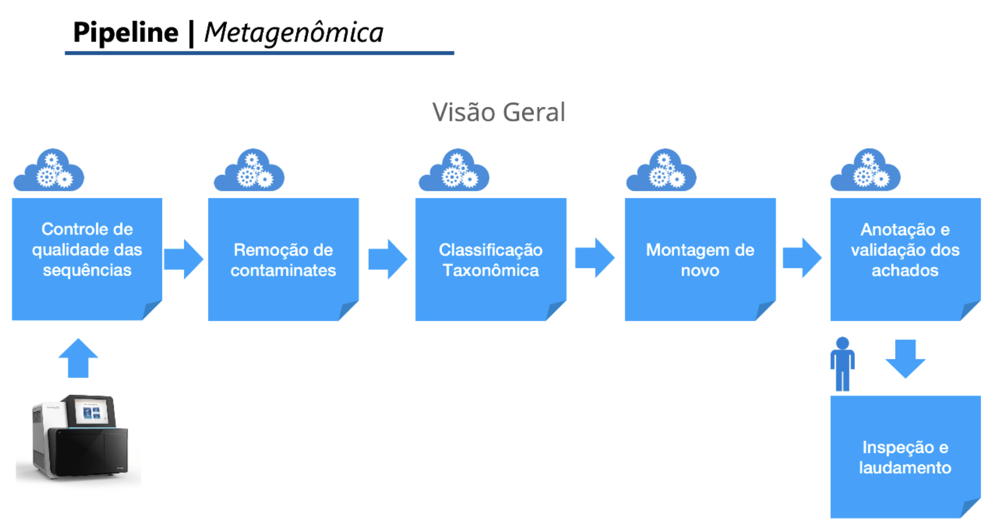

Comecemos com um banco geral de sequências referências de bactérias, alguns fungos, vírus e humanos.  

In [9]:
%%bash
# Download banco de bactérias, fungos, vírus e humano (cerca de 3 min)
wget https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz

--2025-10-12 15:18:44--  https://genome-idx.s3.amazonaws.com/kraken/k2_pluspf_08_GB_20250714.tar.gz
Resolving genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)... 54.231.169.105, 3.5.8.118, 3.5.9.216, ...
Connecting to genome-idx.s3.amazonaws.com (genome-idx.s3.amazonaws.com)|54.231.169.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5940987009 (5.5G) [application/x-tar]
Saving to: ‘k2_pluspf_08_GB_20250714.tar.gz.1’

     0K .......... .......... .......... .......... ..........  0%  162K 9h57m
    50K .......... .......... .......... .......... ..........  0%  224K 8h35m
   100K .......... .......... .......... .......... ..........  0%  663K 6h32m
   150K .......... .......... .......... .......... ..........  0%  681K 5h29m
   200K .......... .......... .......... .......... ..........  0%  153K 6h29m
   250K .......... .......... .......... .......... ..........  0%  509M 5h24m
   300K .......... .......... .......... .......... ..........  0%

In [11]:
%%bash
# Extrair o banco para uma pasta (cerca de 2 min)
tar -xzvf k2_pluspf_08_GB_20250714.tar.gz -C krakenDB/
rm k2_pluspf_08_GB_20250714.tar.gz

hash.k2d
opts.k2d
taxo.k2d
seqid2taxid.map
inspect.txt
ktaxonomy.tsv
library_report.tsv
nodes.dmp
names.dmp
database50mers.kmer_distrib
database75mers.kmer_distrib
database100mers.kmer_distrib
database150mers.kmer_distrib
database200mers.kmer_distrib
database250mers.kmer_distrib
database300mers.kmer_distrib
unmapped_accessions.txt


In [13]:
%%bash
# Download do banco de definições de taxonomia do NCBI
bash ../env/opt/krona/updateTaxonomy.sh

Fetching taxdump.tar.gz...
   Fetching checksum...
   Checksum for taxdump.tar.gz matches server.
Extracting taxonomy...

Cleaning up...

Finished.



Estando os bancos de sequências prontos, podemos seguir para a etapa de classificação das sequências desconhecidas.

# 3. Identificação Taxonômica

In [14]:
%%bash
# Buscar cada sequência contra um banco de dados e fazer a classificação (cerca de 1 min)
for file in raw/*_1.fastq.gz;
  do sample=$(basename $file "_1.fastq.gz");
  kraken2 --db krakenDB --paired "cutadapt/${sample}-trimmed_R1.fastq.gz" "cutadapt/${sample}-trimmed_R2.fastq.gz" \
  --report "kraken2/${sample}-report.txt" --report-minimizer --output "kraken2/${sample}-output.txt";
  done

Loading database information... done.
99579 sequences (27.93 Mbp) processed in 0.665s (8988.5 Kseq/m, 2521.47 Mbp/m).
  27894 sequences classified (28.01%)
  71685 sequences unclassified (71.99%)
Loading database information... done.
99223 sequences (27.80 Mbp) processed in 0.613s (9707.3 Kseq/m, 2719.64 Mbp/m).
  49144 sequences classified (49.53%)
  50079 sequences unclassified (50.47%)
Loading database information... done.
99630 sequences (27.95 Mbp) processed in 0.622s (9614.3 Kseq/m, 2697.65 Mbp/m).
  52145 sequences classified (52.34%)
  47485 sequences unclassified (47.66%)
Loading database information... done.
96209 sequences (26.61 Mbp) processed in 0.591s (9759.8 Kseq/m, 2699.48 Mbp/m).
  72088 sequences classified (74.93%)
  24121 sequences unclassified (25.07%)
Loading database information... done.
98981 sequences (27.70 Mbp) processed in 0.631s (9415.7 Kseq/m, 2634.68 Mbp/m).
  83190 sequences classified (84.05%)
  15791 sequences unclassified (15.95%)
Loading database inf

Tente gerar os gráficos de relatórios para cada uma das amostras em loop adaptando o comando abaixo:

```
%%bash
# Gerar um gráfico de pizza iterativo com a classificação do kraken
ktImportTaxonomy kraken2/patient-dark-fungi-output.txt \
-o krona/patient-dark-fungi-kraken.html -q 2 -t 3
```

In [ ]:
%%bash
for file in kraken2/*;
do
    if *-output.txt in file.name
        ktImportTaxonomy kraken2/${file.name}-output.txt \
        -o krona/${file.name}-kraken.html -q 2 -t 3
        fi

**Checkpoint 2**: Inspecione os resultados gerados em cada uma das amostras. Você consegue chegar a alguma conclusão a respeito destes pacientes?

# 4. Engenharia de features com resultados da bioinformática

Neste momento, nós vamos extrair os resultados de identificação de organismos gerados pelo kraken, e tranformá-los em features que podem ser usadas para treinar um modelo de machine learning.

In [ ]:
# Bibliotecas necessárias
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import shap
from collections import Counter
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

In [ ]:
# Carregar o arquivo de metadados das amostras com o target de predição para cancer coloretal
# Entenda o que significa cada coluna
metadata = pd.read_csv('metadata/metadata.csv', sep=',')
metadata

In [ ]:
# Função que processa um arquivo do Kraken2 e retorna uma Series com abundâncias dos gêneros
# Note que escolhemos usar a abundância relativa de gênero, mas poderíamos usar outras medidas ou até criar novas
# Tente fazer em casa para outras fetures
def parse_kraken2_kreport_genera(filename):
    col_names = ['relative_abundance', 'clade_reads', 'taxon_reads', 'taxonomy_minimizer1', 'taxonomy_minimizer2', 'rank', 'taxonomy_id', 'name']
    # Lê arquivo, ignora linhas com erro ou arquivo não encontrado
    try:
        df = pd.read_csv(filename, sep='\t', names=col_names, skipinitialspace=True)
        df_genus = df[df['rank'] == 'G']
        genus_abundance = df_genus.groupby('name')['relative_abundance'].sum()
        return genus_abundance
    except Exception as e:
        print(f"Erro ao processar {filename}: {e}")
        return pd.Series()  # Retorna series vazia se problema


In [ ]:
# Vamos agora pivotar a tabela, ou seja, fazer ela virar uma tabela de features para ML
all_samples = []
for idx, row in metadata.iterrows():
    accession = row['accession']
    fname = f'kraken2/{accession}-report.txt'
    genus_profile = parse_kraken2_kreport_genera(fname)
    genus_profile['accession'] = accession  # Mantém o accession para merge posterior
    all_samples.append(genus_profile)
# Monta DataFrame com todas as amostras e faz o pivot (gêneros como colunas)
df_all = pd.DataFrame(all_samples).set_index('accession')
# Opcionalmente, pode juntar com outros metadados:
df_final = df_all.join(metadata.set_index('accession'))

df_final

# 5. Machine Learning e predição precoce de câncer coloretal

Agora vamos tentar fazer o treinamento e predição para os 10 pacientes que temos.

In [ ]:
# e que "target" é a coluna alvo

# Isola features (X) e o target (y)
X = df_final.drop(columns=['target', 'sample'])  # remove também sample ou outras colunas não-numéricas
y = df_final['target']

In [ ]:
# Divide em treino e teste (70% treino, 30% teste)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


In [ ]:
# Cria, treina e avalia o Random Forest
clf = RandomForestClassifier(n_estimators=10, random_state=42)
clf.fit(X_train, y_train)

In [ ]:
# Previsão e relatório
y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred))

In [ ]:
# clf: RandomForest treinado
# feature_cols: lista de colunas de features (gêneros)
def plot_rf_importances(clf, feature_cols, top_n=20):
    importances = clf.feature_importances_
    fi = pd.Series(importances, index=feature_cols).sort_values(ascending=True)
    top = fi.tail(top_n)
    plt.figure(figsize=(8, max(4, 0.25*len(top))))
    plt.barh(top.index, top.values, color='C0')
    plt.xlabel('Feature importance (mean decrease in impurity)')
    plt.title(f'Top {len(top)} feature importances — Random Forest')
    plt.tight_layout()
    plt.show()


Dez exemplos é muito pouco, vamos tentar aumentar um pouco o nosso dataset com data augumentation:

In [ ]:
# df_final existe com:
# - colunas numéricas com abundâncias dos gêneros
# - coluna 'target' com labels
# - possivelmente colunas de metadados (string) como 'sample' ou outras

def augment_with_smote(df, target_col='target', desired_n=100, random_state=42):
    # Separa features e target
    meta_cols = df.select_dtypes(include=['object']).columns.tolist()
    meta_cols = [c for c in meta_cols if c != target_col]  # mantém apenas metadados, exclui target
    # As colunas de features numéricas: todas menos metadados e target
    feature_cols = [c for c in df.columns if c not in meta_cols + [target_col]]

    X = df[feature_cols].fillna(0).values
    y = df[target_col].values

    # Checa tamanho atual e calcula quantas amostras queremos a mais
    n_current = X.shape[0]
    if desired_n <= n_current:
        raise ValueError(f"desired_n must be greater than current samples ({n_current})")

    # Usar scaling antes de SMOTE pode ajudar (SMOTE usa distâncias)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Calcula quantas amostras por classe serão necessárias para alcançar desired_n
    # Estratégia: manter proporção original entre classes
    counts = Counter(y)
    total = sum(counts.values())
    desired_counts = {cls: int(np.round(counts[cls] / total * desired_n)) for cls in counts}
    # Ajuste final para garantir soma == desired_n (corrige por arredondamento)
    s = sum(desired_counts.values())
    if s != desired_n:
        # ajusta classe majoritária
        major_class = max(desired_counts, key=desired_counts.get)
        desired_counts[major_class] += (desired_n - s)

    # Define sampling_strategy para SMOTE: dict {class_label: n_samples_after}
    sampling_strategy = {}
    for cls, desired_c in desired_counts.items():
        # only include classes where desired > current
        current_c = counts[cls]
        if desired_c > current_c:
            sampling_strategy[cls] = desired_c

    if not sampling_strategy:
        raise ValueError("No class needs oversampling (desired_n too small or equal distribution).")

    # SMOTE: por padrão retorna X_res, y_res com shapes aumentados
    sm = SMOTE(sampling_strategy=sampling_strategy, random_state=random_state, k_neighbors=3)
    X_res, y_res = sm.fit_resample(X_scaled, y)

    # Converte de volta escala original
    X_res_unscaled = scaler.inverse_transform(X_res)
    df_res = pd.DataFrame(X_res_unscaled, columns=feature_cols)
    df_res[target_col] = y_res

    # Para as linhas originais que tinham metadados, copia para as respectivas primeiras n_current linhas
    # Para amostras sintetizadas, preenche metadados com NaN ou com placeholders
    metas = df[meta_cols].reset_index(drop=True)
    metas_res = pd.concat([metas, pd.DataFrame(index=range(len(X_res_unscaled) - len(metas), len(X_res_unscaled)))], ignore_index=True)
    # Metadados extras ficam NaN
    metas_res = metas_res.iloc[:len(df_res)].reset_index(drop=True)
    df_res = pd.concat([metas_res, df_res.reset_index(drop=True)], axis=1)

    # Adiciona coluna indicando se foi sintético
    is_synth = np.array([False]*n_current + [True]*(len(df_res)-n_current))
    df_res['is_synthetic'] = is_synth[:len(df_res)]

    return df_res, feature_cols

df_augmented, feature_cols = augment_with_smote(df_final, target_col='target', desired_n=100, random_state=42)


In [ ]:
# Em seguida, treina um Random Forest com split 70/30
def train_rf_on_augmented(df_aug, feature_cols, target_col='target', test_size=0.3, random_state=62):
    X = df_aug[feature_cols].fillna(0).values
    y = df_aug[target_col].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    clf = RandomForestClassifier(n_estimators=100, random_state=random_state)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print("Classification report on augmented data (test set):")
    print(classification_report(y_test, y_pred))
    return clf

clf = train_rf_on_augmented(df_augmented, feature_cols, target_col='target', test_size=0.3, random_state=42)


In [ ]:
plot_rf_importances(clf, feature_cols)